In [ ]:
import torch
print("PyTorch version: ",torch.__version__)
print("CUDA available: ",torch.cuda.is_available())
if torch.cuda.is_available:
  print(" GPU: ",torch.cuda.get_device_name(0))
else:
  print("No GPU")

PyTorch version:  2.9.0+cu126
CUDA available:  True
 GPU:  Tesla T4


In [ ]:
!pip install ultralytics -q

from ultralytics import YOLO
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

print("YOLO installed successfully !")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.8 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO installed successfully !


In [ ]:
model = YOLO('yolov8n.pt')

print("YOLOv8 model loaded")
print(f"Model can detect {len(model.names)} classes")
print(f"Classes: {list(model.names.values())[:10]}... (showing first10)")

YOLOv8 model loaded
Model can detect 80 classes
Classes: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light']... (showing first10)


In [ ]:
!wget -q https://ultralytics.com/images/bus.jpg -O bus.jpg
!wget -q https://ultralytics.com/images/zidane.jpg -O zidane.jpg

print("Sample images are ready")

Sample images are ready



image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 70.9ms
Speed: 11.9ms preprocess, 70.9ms inference, 43.6ms postprocess per image at shape (1, 3, 640, 480)


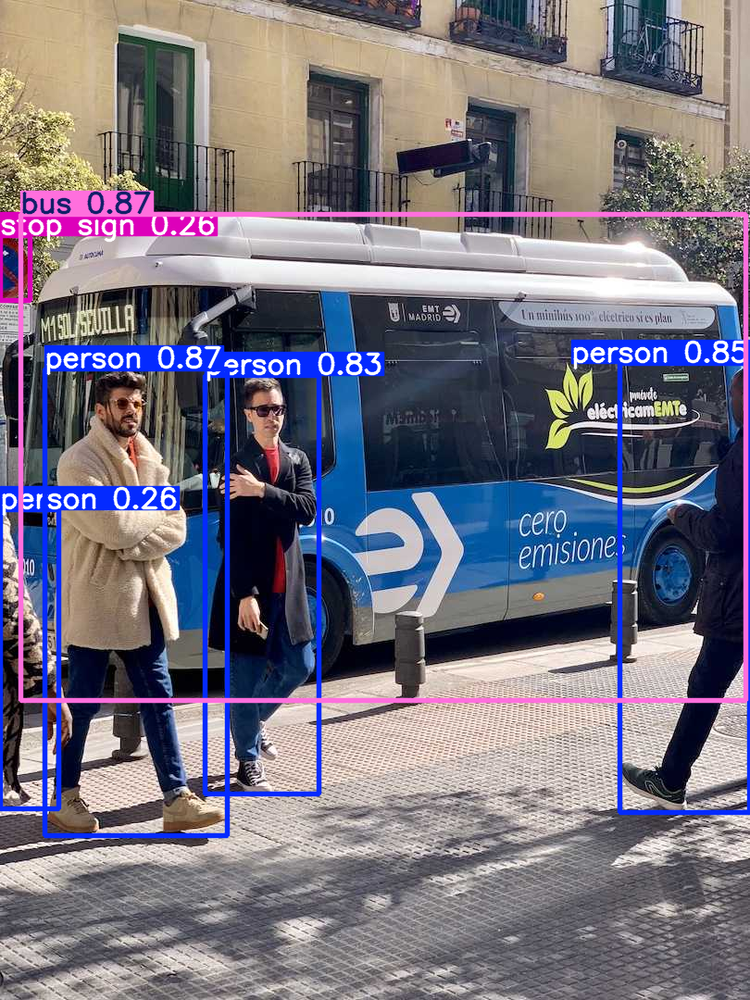

Detection completed


In [ ]:
result = model('bus.jpg')
result[0].show()
print("Detection completed")

In [ ]:
result = result[0]

print("-"*50)
print("Objects detected: ")
print("-"*50)

for box in result.boxes:
  class_id = int(box.cls[0])
  class_name = model.names[class_id]

  confidence = float(box.conf[0])

  x1, y1, x2, y2 = box.xyxy[0].tolist()

  print(f"Object: {class_name}")
  print(f"Confidence: {confidence:.2%}")
  print(f"Location: ({int(x1)}, {int(x2)}, {int(y1)}, {int(y2)})")
  print("-"*50)

--------------------------------------------------
Objects detected: 
--------------------------------------------------
Object: bus
Confidence: 87.34%
Location: (22, 805, 231, 756)
--------------------------------------------------
Object: person
Confidence: 86.57%
Location: (48, 245, 398, 902)
--------------------------------------------------
Object: person
Confidence: 85.28%
Location: (669, 809, 392, 877)
--------------------------------------------------
Object: person
Confidence: 82.52%
Location: (221, 344, 405, 857)
--------------------------------------------------
Object: person
Confidence: 26.11%
Location: (0, 63, 550, 873)
--------------------------------------------------
Object: stop sign
Confidence: 25.51%
Location: (0, 32, 254, 324)
--------------------------------------------------



0: 640x640 4 persons, 1 bus, 6.8ms
1: 640x640 2 persons, 1 tie, 6.8ms
Speed: 2.5ms preprocess, 6.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


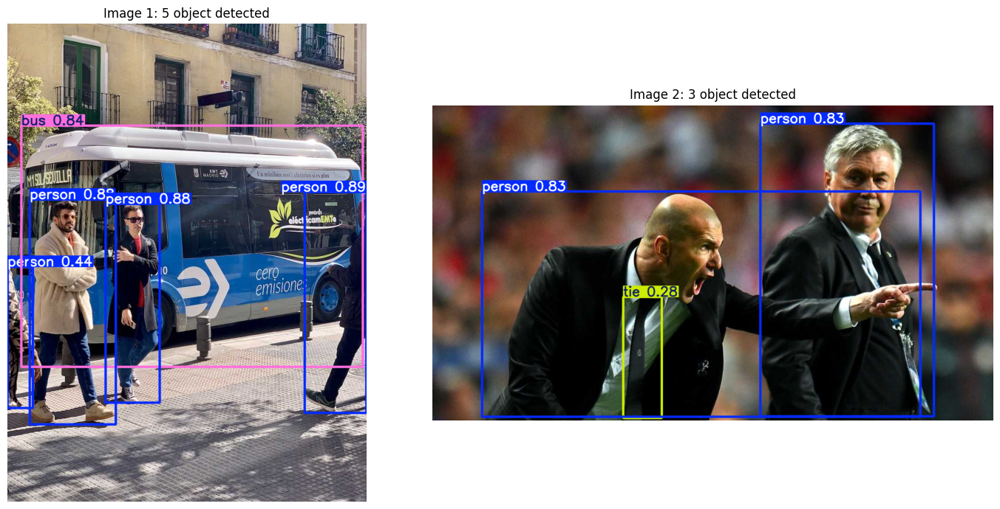

Multiple image detection complete


In [ ]:
results = model(['bus.jpg','zidane.jpg'])

fig, axes = plt.subplots(1,2, figsize=(15,7))

for idx, result in enumerate(results):
  img = result.plot()
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  axes[idx].imshow(img_rgb)
  axes[idx].axis('off')
  axes[idx].set_title(f"Image {idx+1}: {len(result.boxes)} object detected")

plt.tight_layout()
plt.show()

print("Multiple image detection complete")


image 1/1 /content/bus.jpg: 640x480 3 persons, 1 bus, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)
Detection with confidence > 50%: 
  -bus: 87.34%
  -person: 86.57%
  -person: 85.28%
  -person: 82.52%


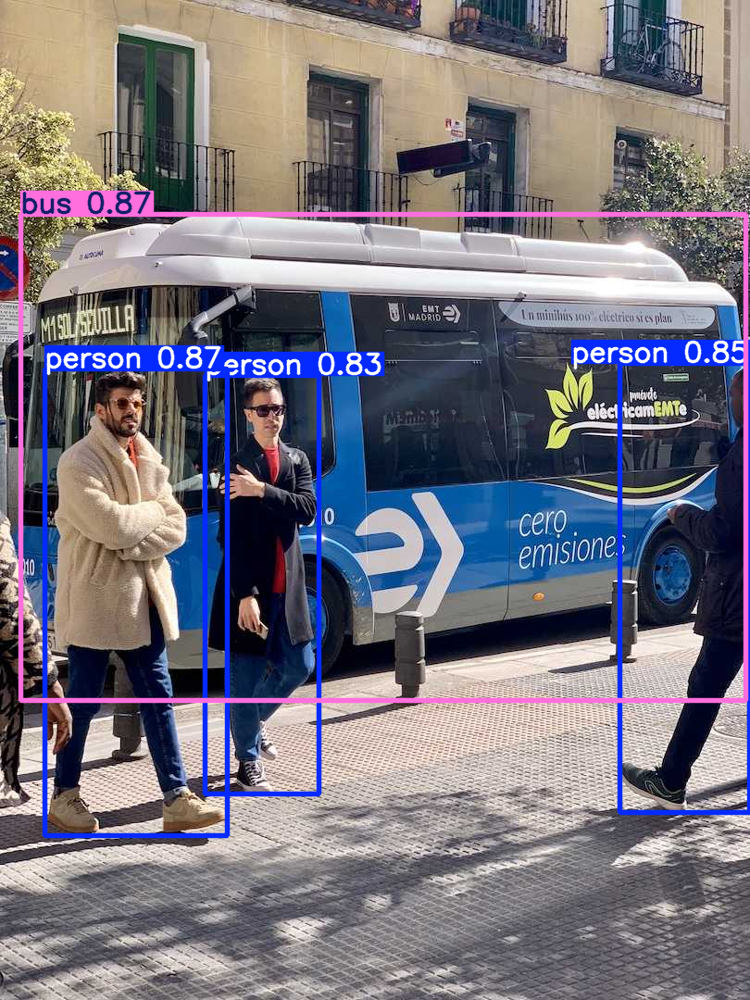

In [ ]:
results = model('bus.jpg', conf=0.5)

print("Detection with confidence > 50%: ")

for box in results[0].boxes:
  class_name = model.names[int(box.cls[0])]
  confidence = float(box.conf[0])

  print(f"  -{class_name}: {confidence:.2%}")

results[0].show()


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 7.9ms
Speed: 3.6ms preprocess, 7.9ms inference, 68.6ms postprocess per image at shape (1, 3, 640, 480)
Detecting only: person, car, bus


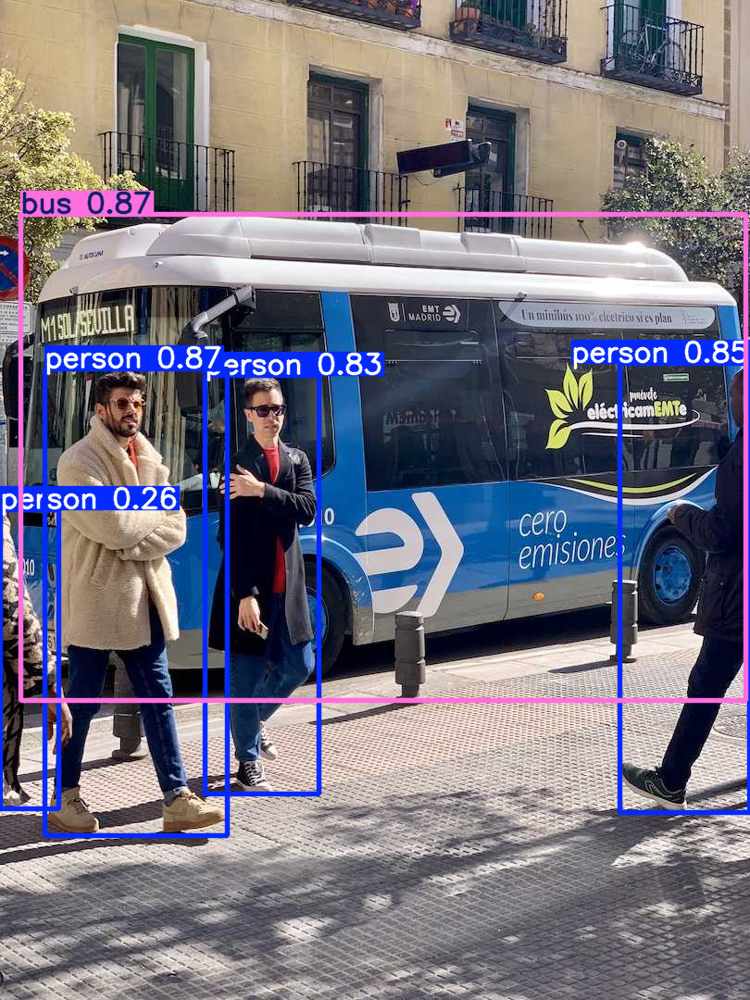

  - Found: bus
  - Found: person
  - Found: person
  - Found: person
  - Found: person


In [ ]:
results = model('bus.jpg', classes=[0,2,5])

print("Detecting only: person, car, bus")
results[0].show()

for box in results[0].boxes:
  class_name = model.names[int(box.cls[0])]
  print(f"  - Found: {class_name}")

In [ ]:
!wget -q https://github.com/intel-iot-devkit/sample-videos/raw/master/people-detection.mp4 -O people.mp4

results = model('people.mp4',stream=True)

output_path = 'output_video.mp4'

for i, result in enumerate(results):
  if i == 0:
    height, width = result.orig_img.shape[:2]
    fps = 30

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))
  annotated_Frame = result.plot()
  out.write(annotated_Frame)

  if i%30==0:
    print(f"Processed frame {i}")
out.release()
print("Video saved as '{output_path}'")

from IPython.display import Video
Video(output_path, width=600)


video 1/1 (frame 1/596) /content/people.mp4: 384x640 (no detections), 8.5ms
Processed frame 0
video 1/1 (frame 2/596) /content/people.mp4: 384x640 (no detections), 6.0ms
video 1/1 (frame 3/596) /content/people.mp4: 384x640 (no detections), 5.8ms
video 1/1 (frame 4/596) /content/people.mp4: 384x640 (no detections), 5.8ms
video 1/1 (frame 5/596) /content/people.mp4: 384x640 (no detections), 5.8ms
video 1/1 (frame 6/596) /content/people.mp4: 384x640 (no detections), 5.9ms
video 1/1 (frame 7/596) /content/people.mp4: 384x640 (no detections), 5.9ms
video 1/1 (frame 8/596) /content/people.mp4: 384x640 (no detections), 6.0ms
video 1/1 (frame 9/596) /content/people.mp4: 384x640 (no detections), 6.1ms
video 1/1 (frame 10/596) /content/people.mp4: 384x640 (no detections), 5.9ms
video 1/1 (frame 11/596) /content/people.mp4: 384x640 (no detections), 5.9ms
video 1/1 (frame 12/596) /content/people.mp4: 384x640 (no detections), 6.0ms
video 1/1 (frame 13/596) /content/people.mp4: 384x640 (no detectio

In [ ]:
results = model('bus.jpg')

object_counts = {}

for box in results[0].boxes:
  class_name = model.names[int(box.cls[0])]
  object_counts[class_name] = object_counts.get(class_name, 0) + 1
print("-"*50)
print("Object count: ")
print("-"*50)

for obj, count in object_counts.items():
  print(f"{obj}: {count}")
  print("-"*50)
  print(f"Total objects: {sum(object_counts.values())}")


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 6.8ms
Speed: 2.4ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)
--------------------------------------------------
Object count: 
--------------------------------------------------
bus: 1
--------------------------------------------------
Total objects: 5
person: 4
--------------------------------------------------
Total objects: 5


In [ ]:
results = model('bus.jpg')
results[0].save('detected_bus.jpg')

results_json = []
for box in results[0].boxes:
  results_json.append({
      'class':model.names[int(box.cls[0])],
      'confidence': float(box.conf[0]),
      'bbox': box.xyxy[0].tolist()
  })

  import json
  with open('detections.json','w') as f:
    json.dump(results_json, f, indent=2)
  print("Results saved!")
  print("  -Image: detected_bus.jpg")
  print("  -JSON: detections.json")


image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 6.5ms
Speed: 2.4ms preprocess, 6.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)
Results saved!
  -Image: detected_bus.jpg
  -JSON: detections.json
Results saved!
  -Image: detected_bus.jpg
  -JSON: detections.json
Results saved!
  -Image: detected_bus.jpg
  -JSON: detections.json
Results saved!
  -Image: detected_bus.jpg
  -JSON: detections.json
Results saved!
  -Image: detected_bus.jpg
  -JSON: detections.json


Libraries imported
Sample image ready
YOLO model loaded

image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 7.3ms
Speed: 3.3ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)


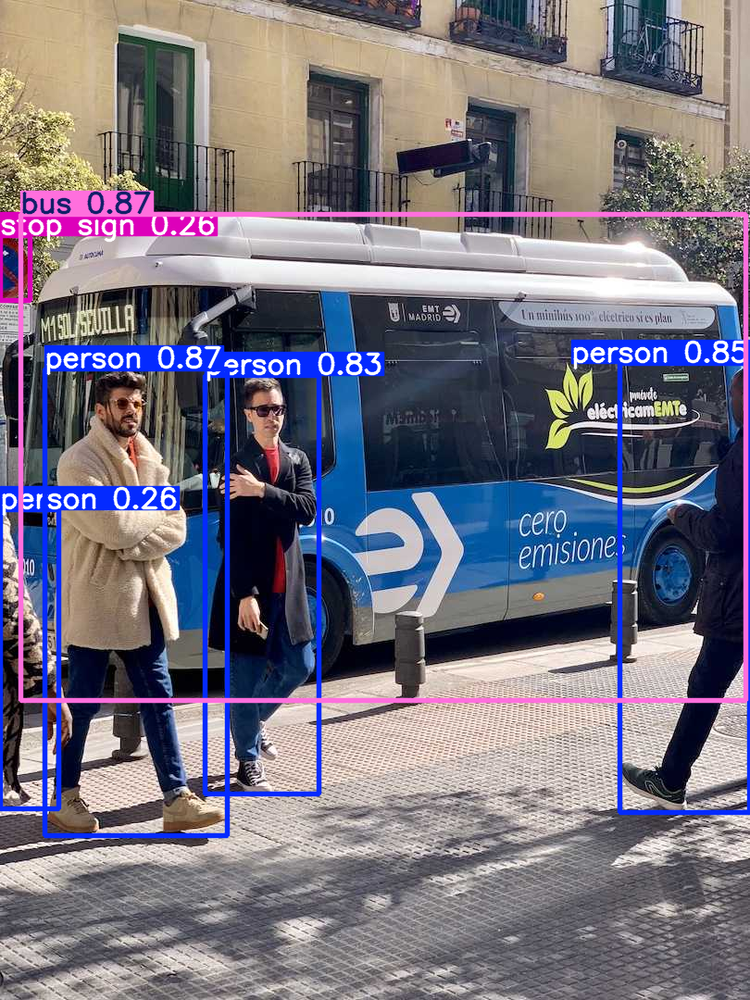

YOLO detected 6 objects

----------------------------------------------------------------------
ADDITIONAL ANALYSIS: BOX DIMENSION CLASSIFICATION
----------------------------------------------------------------------

Object #1
  YOLO Detection: bus (87.3% confidence)
  Dimensions: 782 × 525 pixels
  Area: 411059 px² (47.0% of image)
  Size Class: LARGE
  Shape Class: SQUARE
  Aspect Ratio: 0.67

Object #2
  YOLO Detection: person (86.6% confidence)
  Dimensions: 196 × 504 pixels
  Area: 99214 px² (11.3% of image)
  Size Class: MEDIUM
  Shape Class: TALL
  Aspect Ratio: 2.56

Object #3
  YOLO Detection: person (85.3% confidence)
  Dimensions: 140 × 484 pixels
  Area: 67998 px² (7.8% of image)
  Size Class: MEDIUM
  Shape Class: TALL
  Aspect Ratio: 3.46

Object #4
  YOLO Detection: person (82.5% confidence)
  Dimensions: 123 × 451 pixels
  Area: 55768 px² (6.4% of image)
  Size Class: MEDIUM
  Shape Class: TALL
  Aspect Ratio: 3.66

Object #5
  YOLO Detection: person (26.1% confidence)

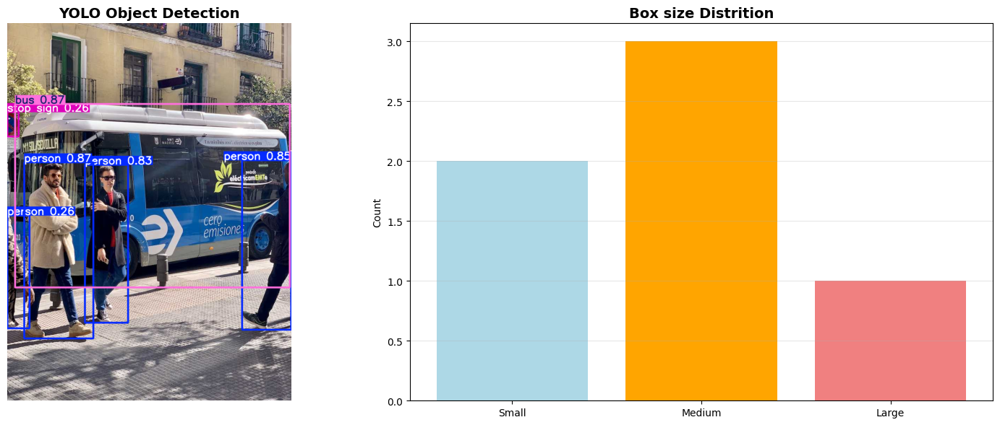

Enhanced analysis completed


In [ ]:
!pip install ultralytics -q
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
import numpy as np

print("Libraries imported")

!wget -q https://ultralytics.com/images/bus.jpg -O bus.jpg
print("Sample image ready")

model = YOLO('yolov8n.pt')
print("YOLO model loaded")

results = model('bus.jpg')
result = results[0]
result.show()
print(f"YOLO detected {len(result.boxes)} objects")

img_height, img_width = result.orig_img.shape[:2]
img_area = img_height * img_width

print("\n" + "-" * 70)
print("ADDITIONAL ANALYSIS: BOX DIMENSION CLASSIFICATION")
print("-" * 70)

for i, box in enumerate(result.boxes, 1):

    class_name = model.names[int(box.cls[0])]
    confidence = float(box.conf[0])

    x1, y1, x2, y2 = box.xyxy[0].tolist()

    box_width = x2 - x1
    box_height = y2 - y1
    box_area = box_width * box_height
    area_percentage = (box_area / img_area) * 100
    aspect_ratio = box_height / box_width


    if area_percentage < 5:
        size_class = "SMALL"
    elif area_percentage < 25:
        size_class = "MEDIUM"
    else:
        size_class = "LARGE"


    if aspect_ratio > 1.5:
        shape_class = "TALL"
    elif aspect_ratio < 0.67:
        shape_class = "WIDE"
    else:
        shape_class = "SQUARE"


    print(f"\nObject #{i}")
    print(f"  YOLO Detection: {class_name} ({confidence:.1%} confidence)")
    print(f"  Dimensions: {int(box_width)} × {int(box_height)} pixels")
    print(f"  Area: {int(box_area)} px² ({area_percentage:.1f}% of image)")
    print(f"  Size Class: {size_class}")
    print(f"  Shape Class: {shape_class}")
    print(f"  Aspect Ratio: {aspect_ratio:.2f}")

fig, axes = plt.subplots(1,2,figsize=(16,6))
img_with_boxes = result.plot()
img_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
axes[0].imshow(img_rgb)
axes[0].set_title('YOLO Object Detection', fontsize=14, fontweight='bold')
axes[0].axis('off')

size_counts = {'Small':0, 'Medium':0, 'Large':0}

for box in result.boxes:
  x1,y1,x2,y2 = box.xyxy[0].tolist()
  box_area = (x2-x1) * (y2-y1)
  area_pct = (box_area/img_area) * 100

  if area_pct < 5:
    size_counts['Small'] += 1
  elif area_pct < 25:
    size_counts['Medium'] += 1
  else:
    size_counts['Large'] += 1

axes[1].bar(size_counts.keys(), size_counts.values(),color = ['lightblue','orange','lightcoral'])
axes[1].set_title('Box size Distrition', fontsize=14,fontweight='bold')
axes[1].set_ylabel('Count')
axes[1].grid(axis='y',alpha=0.3)
plt.tight_layout()
plt.show()

print("Enhanced analysis completed")